# Exploratory Data Analysis (EDA)
This notebook will focus on EDA of the cleaned datasets. 

In [1]:
# import packages
import pandas as pd
import geopandas as gpd
import numpy as np
import pickle
from datetime import datetime
import calendar
import json

# visulaztion packages
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import folium
import ipyleaflet
from branca.colormap import linear
import ipywidgets

# import functions
import sys
sys.path.append('/Users/justinwilliams/projects/gun-violence/src')
from general_functions import save_fig, hist_func, bar_horiz, ratio_func, create_choropleth_map,\
interactive_choro, date_column
from shiny_functions import groupby_mult, rate_per_1k, rgb_to_hex, divide_metric, int_choro_ipyleaflet

# supress warnings
import warnings
warnings.filterwarnings("ignore")

In [2]:
# import pickled data
df_gun = pd.read_pickle("./data/pickle/df_gun_violence")

# preview
df_gun.head()

,incident_id,incident_date,state,city_or_county,address,#_killed,#_injured
0,2478664,2022-12-11,Illinois,Chicago,5500 block of W School St,3,1
1,2478061,2022-12-09,Arizona,Phoenix,S 21st and W Burgess LN,1,3
2,2477622,2022-12-08,Michigan,Detroit,1114 Washington Blvd,0,4
3,2477404,2022-12-08,Louisiana,New Orleans,4242 Chef Menteur Hwy,0,4
4,2475554,2022-12-06,New York,Bronx,Daly Ave and E 180th St,0,4


## Summary Statistics

In [3]:
df_gun.describe()

,incident_id,#_killed,#_injured
count,2.000000e+03,2000.000000,2000.000000
mean,2.033979e+06,0.976000,4.149500
std,2.654732e+05,1.389744,2.188274
min,1.535478e+06,0.000000,0.000000
25%,1.786823e+06,0.000000,3.000000
50%,2.050260e+06,1.000000,4.000000
75%,2.274785e+06,1.000000,5.000000
max,2.478664e+06,22.000000,29.000000


As expected, looks like `#_injured` is more common than `#_killed` by almost 4:1 ratio on average per mass shooting. 

**Standard deviation** of `#_killed` is significantly smaller than `#_injured` suggesting it deosn't vary that much, in fact the 75th percentile is only 1. This tells us the **Max** of 22 is extremely rare. I wonder what the statistical likiehood of that event happening.

## Exploratory Plots

### Histograms

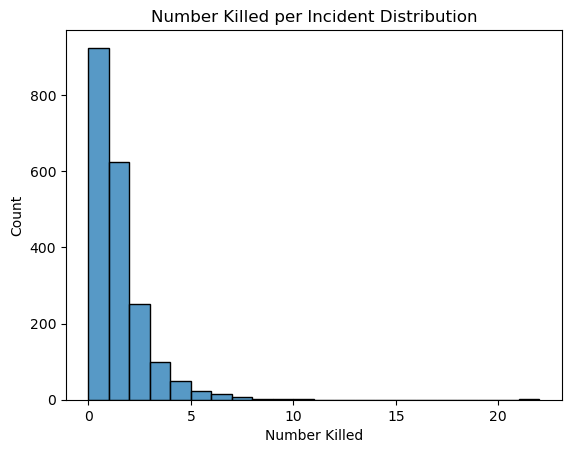

In [4]:
# histogram killed
hist_func(df_gun, "#_killed", "Number Killed per Incident Distribution", "Number Killed")

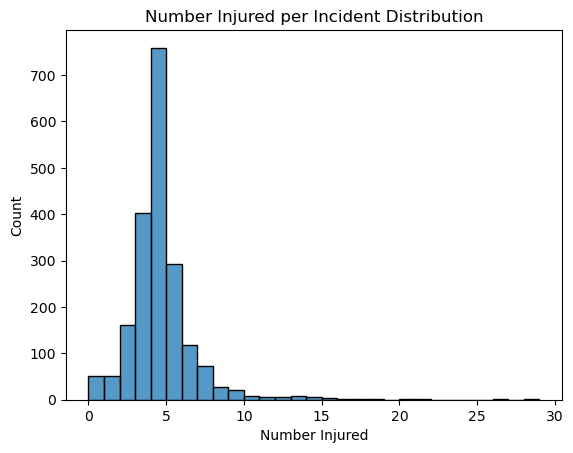

In [5]:
# histogram injured
hist_func(df_gun, "#_injured", "Number Injured per Incident Distribution", "Number Injured")

We can see that `#_injured` is much more normal than `#_killed`, however there are still some outliers in `#_injured`.
<br>
`#_killed` is right-skewed.
<br>
4 is the most common amount for those injured.

### Boxplots

In [6]:
# melt to utilize catplot
df_gun_melt = df_gun.melt(
    id_vars=['incident_id', 'incident_date', 'state', 'city_or_county', 'address'])

# preview
df_gun_melt.head()

,incident_id,incident_date,state,city_or_county,address,variable,value
0,2478664,2022-12-11,Illinois,Chicago,5500 block of W School St,#_killed,3
1,2478061,2022-12-09,Arizona,Phoenix,S 21st and W Burgess LN,#_killed,1
2,2477622,2022-12-08,Michigan,Detroit,1114 Washington Blvd,#_killed,0
3,2477404,2022-12-08,Louisiana,New Orleans,4242 Chef Menteur Hwy,#_killed,0
4,2475554,2022-12-06,New York,Bronx,Daly Ave and E 180th St,#_killed,0


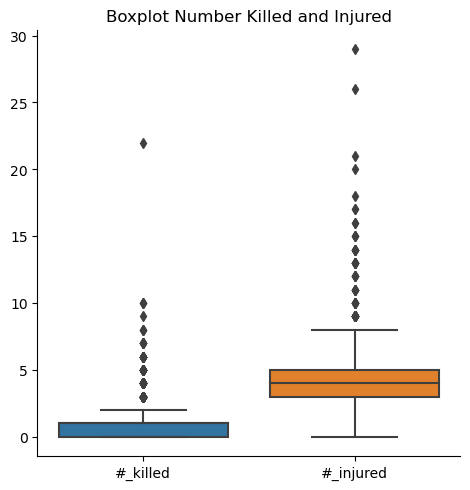

In [7]:
# boxplot
sns.catplot(data=df_gun_melt,kind="box",
           x="variable", y="value")
plt.title("Boxplot Number Killed and Injured")
plt.ylabel("")
plt.xlabel("")
plt.show()

### Scatterplot
Let's take a look at the relationship of killed vs. injured

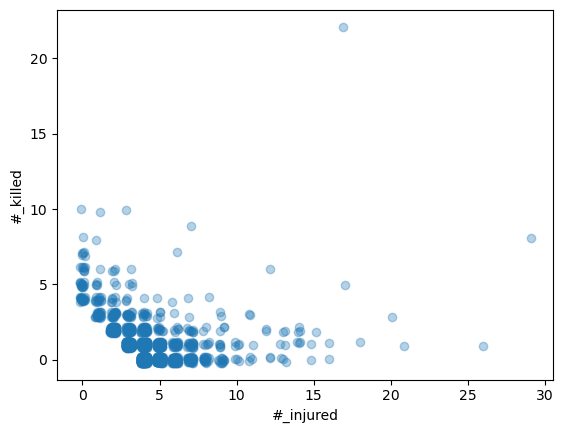

In [8]:
# scatterplot
sns.regplot(data=df_gun,
            x="#_injured",
            y="#_killed", 
            fit_reg=False,
            x_jitter=0.2,
            y_jitter=0.2,
            scatter_kws = {'alpha' : 1/3})
plt.show()

Looks like there is a negative relationship between `#_injured` and `#_killed`.

### State Exploration
Let's look at which states have the most mass shootings.<br>
Some states have higher population then others, therefore we will need to bring in some census data soon so we can compare this in ratio per 1,000 population as opposed to pure amount. 

In [9]:
# first sum up each column
tot_injured = df_gun["#_injured"].sum()
tot_killed = df_gun["#_killed"].sum()

print("Number injured:", tot_injured)
print("Number killed:", tot_killed)
print("Ratio of killed to injured", round(tot_killed/tot_injured,2))

Number injured: 8299
Number killed: 1952
Ratio of killed to injured 0.24


In [10]:
# state killed
df_state_killed = groupby_mult(df_gun,"state",{"#_killed":"sum"},"#_killed")
# state injured
df_state_injured = groupby_mult(df_gun,"state",{"#_injured":"sum"},"#_injured")

In [11]:
#top 5
print(df_state_injured.head())
print("\n")
print(df_state_killed.head())

        state  #_injured
0    Illinois        963
1       Texas        584
2  California        559
3    New York        455
4     Florida        434


        state  #_killed
0       Texas       200
1  California       179
2    Illinois       153
3     Florida        84
4     Georgia        78


Saving figure number_killed_by_state


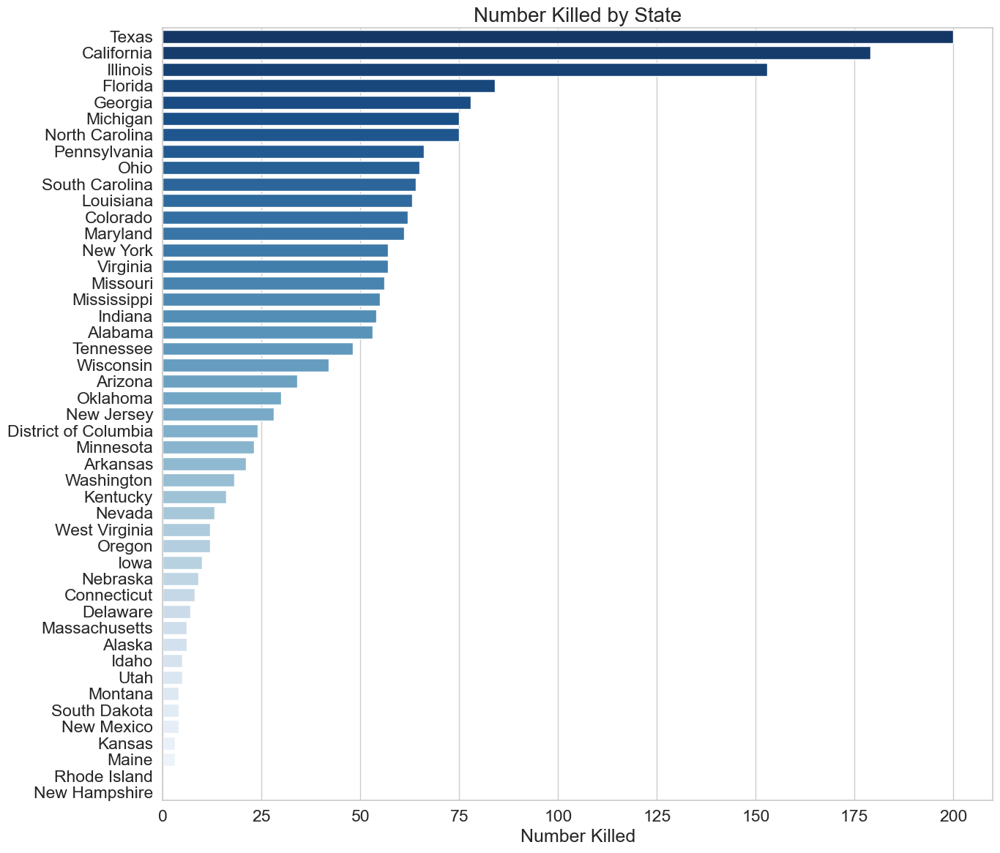

In [12]:
bar_horiz(df=df_state_killed, colx="#_killed",
          coly="state",xlabel="Number Killed", title="Number Killed by State")

Saving figure number_injured_by_state


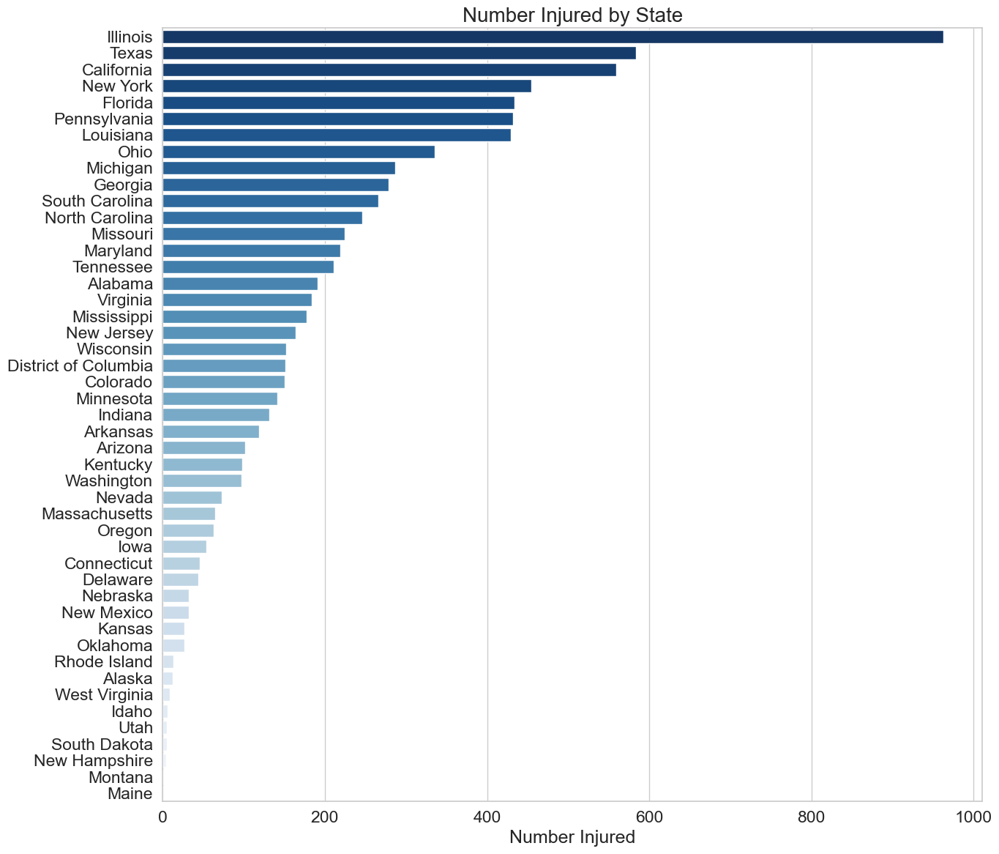

In [13]:
bar_horiz(df_state_injured, "#_injured", "state","Number Injured", "Number Injured by State")

This plot would be interesting as a map as well.<br>
Also to compare top 5.

Well what if we normalize the states to compare by `#_injured` and `#_killed` by ratio of events happening within each state.<br>
So, per event, how many are injured and how many are killed.

In [14]:
# create variables for function
groupby_list = ["state"]
agg_dict = {"#_injured":"sum","#_killed":"sum","incident_id":"count"}
sort_list = ["incident_id","#_injured","#_killed"]
rename_dict = {"incident_id":"count"}

# apply function
df_state_grouped = groupby_mult(df_gun, groupby_list, agg_dict, sort_list)

# preview result
df_state_grouped.head()

,state,#_injured,#_killed,incident_id
0,Illinois,963,153,214
1,Texas,584,200,146
2,California,559,179,145
3,New York,455,57,104
4,Pennsylvania,432,66,104


In [15]:
# rename incident_id col
df_state_grouped.rename(columns={"incident_id":"count"}, inplace=True)

In [16]:
# create total injured/killed column per state
df_state_grouped["total_injured_killed"] = \
df_state_grouped["#_killed"] + df_state_grouped["#_injured"]

Now need to create ratio columns

In [17]:
# set variables for function
col1_list = ["#_killed", "#_injured", "total_injured_killed"]
col2_list = ["count","count","count"]
new_col_list = ["killed_by_incident", "injured_by_incident", "total_by_incident"]


# killed by incident
ratio_func(df_state_grouped,col1_list, col2_list, new_col_list)

In [18]:
# preview results ratio columns
df_state_grouped.sort_values(by="killed_by_incident", ascending=False).head()

,state,#_injured,#_killed,count,total_injured_killed,killed_by_incident,injured_by_incident,total_by_incident
45,Montana,1,4,1,5,4.000000,1.000000,5.000000
46,Maine,1,3,1,4,3.000000,1.000000,4.000000
39,West Virginia,9,12,4,21,3.000000,2.250000,5.250000
34,Oklahoma,27,30,11,57,2.727273,2.454545,5.181818
42,Utah,5,5,2,10,2.500000,2.500000,5.000000


Must control by population per 100k otherwise these ratios do not make much sense.

#### Per 100k population

In order to make compare these events fairly between states, we need to normalize the incidents by 100k. Bring in census data to with population figures to calculate this number.

In [19]:
# load census data w/o shp first to get numbers correct
df_census = pd.read_pickle("./data/pickle/df_us_census")

# preview df
df_census.head()

,state,population,state_fips
0,Pennsylvania,12794885.0,42
1,California,39346023.0,06
2,West Virginia,1807426.0,54
3,Utah,3151239.0,49
4,New York,19514849.0,36


In [20]:
# join state grouped df with census data
df_state_census = df_state_grouped.merge(df_census, how="outer")

# preview
df_state_census.head()

,state,#_injured,#_killed,count,total_injured_killed,killed_by_incident,injured_by_incident,total_by_incident,population,state_fips
0,Illinois,963.0,153.0,214.0,1116.0,0.714953,4.500000,5.214953,12716164.0,17
1,Texas,584.0,200.0,146.0,784.0,1.369863,4.000000,5.369863,28635442.0,48
2,California,559.0,179.0,145.0,738.0,1.234483,3.855172,5.089655,39346023.0,06
3,New York,455.0,57.0,104.0,512.0,0.548077,4.375000,4.923077,19514849.0,36
4,Pennsylvania,432.0,66.0,104.0,498.0,0.634615,4.153846,4.788462,12794885.0,42


Create function to do per 100k calculations. 
<br>
Will need the following calculations:
- pop/1k
- count/(pop/1k)
- injured/(pop/1k)
- killed/(pop/1k)
- total/(pop/1k)

In [21]:
# create lists for function
col_list = ["count","#_injured", "#_killed", "total_injured_killed"]
new_col_list = ["count_per_1k", "injured_per_1k","killed_per_1k","total_per_1k"]

# pass to function
rate_per_1k(df_state_census, col_list, new_col_list)

In [22]:
# preview
df_state_census.sort_values(by="pop_per_1k", ascending=False).head(6)

,state,#_injured,#_killed,count,total_injured_killed,killed_by_incident,injured_by_incident,total_by_incident,population,state_fips,pop_per_1k,count_per_1k,injured_per_1k,killed_per_1k,total_per_1k
2,California,559.0,179.0,145.0,738.0,1.234483,3.855172,5.089655,39346023.0,06,39346.0,0.37,1.42,0.45,1.88
1,Texas,584.0,200.0,146.0,784.0,1.369863,4.000000,5.369863,28635442.0,48,28635.0,0.51,2.04,0.70,2.74
5,Florida,434.0,84.0,99.0,518.0,0.848485,4.383838,5.232323,21216924.0,12,21217.0,0.47,2.05,0.40,2.44
3,New York,455.0,57.0,104.0,512.0,0.548077,4.375000,4.923077,19514849.0,36,19515.0,0.53,2.33,0.29,2.62
4,Pennsylvania,432.0,66.0,104.0,498.0,0.634615,4.153846,4.788462,12794885.0,42,12795.0,0.81,3.38,0.52,3.89
0,Illinois,963.0,153.0,214.0,1116.0,0.714953,4.500000,5.214953,12716164.0,17,12716.0,1.68,7.57,1.20,8.78


In [23]:
# restrict df to only rates per 1k, population, state_fips and state column
df_per_1k = df_state_census[['state','population', 'state_fips', 'pop_per_1k', 'count_per_1k',
       'injured_per_1k', 'killed_per_1k', 'total_per_1k']]

# preview
df_per_1k.head()

,state,population,state_fips,pop_per_1k,count_per_1k,injured_per_1k,killed_per_1k,total_per_1k
0,Illinois,12716164.0,17,12716.0,1.68,7.57,1.20,8.78
1,Texas,28635442.0,48,28635.0,0.51,2.04,0.70,2.74
2,California,39346023.0,06,39346.0,0.37,1.42,0.45,1.88
3,New York,19514849.0,36,19515.0,0.53,2.33,0.29,2.62
4,Pennsylvania,12794885.0,42,12795.0,0.81,3.38,0.52,3.89


Look at distribution of per 1k stats

Saving figure Per 1k Distributions


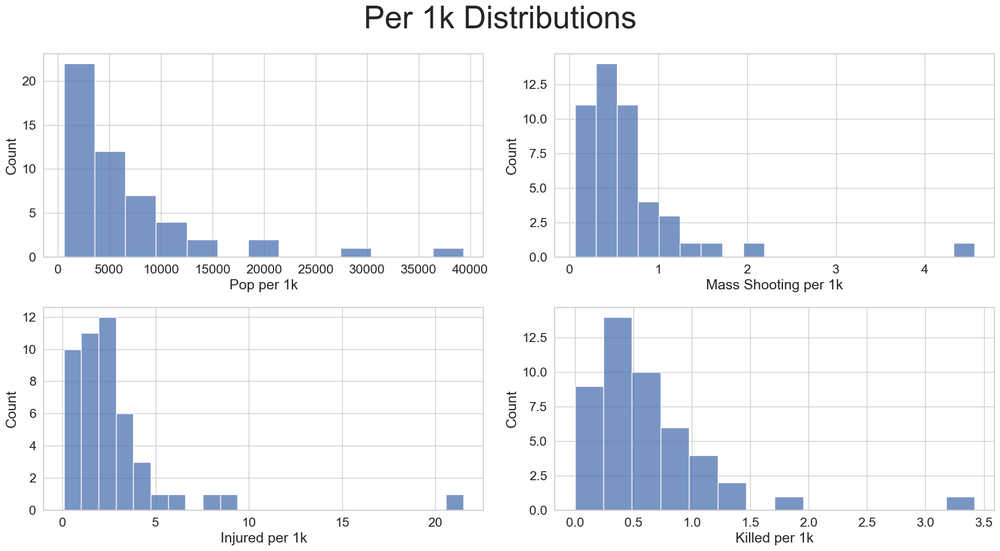

In [24]:
fig, axes = plt.subplots(2, 2, figsize=(18, 10))
 
fig.suptitle('Per 1k Distributions', size=40)
 
sns.histplot(ax=axes[0, 0], data=df_per_1k, x='pop_per_1k').set(xlabel="Pop per 1k")
sns.histplot(ax=axes[0, 1], data=df_per_1k, x='count_per_1k').set(xlabel="Mass Shooting per 1k")
sns.histplot(ax=axes[1, 0], data=df_per_1k, x='injured_per_1k').set(xlabel="Injured per 1k")
sns.histplot(ax=axes[1, 1], data=df_per_1k, x='killed_per_1k').set(xlabel="Killed per 1k")
save_fig("Per 1k Distributions")
plt.show()

Definetly some outliers here, this perhaps could skew some of images I plan on constructing.

Construct Top 10 grouped bar charts based on different per 1k statistics.
Will need to melt some df columns to utilize sns.catplot()

Saving figure incident_by_state_per_1k


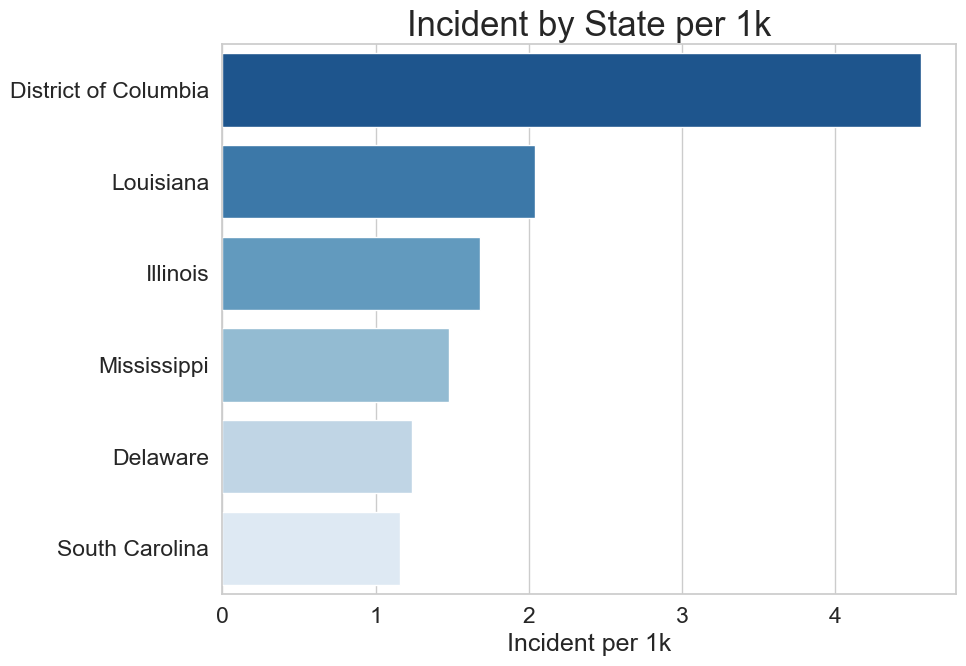

In [25]:
# top N count per 1k
bar_horiz(df_per_1k.sort_values(by="count_per_1k",ascending=False).head(6),
         colx="count_per_1k",
         coly="state",
         xlabel="Incident per 1k",
         title="Incident by State per 1k",
         titlesize=25,
         figsize=(10,7))

Saving figure killed_by_state_per_1k


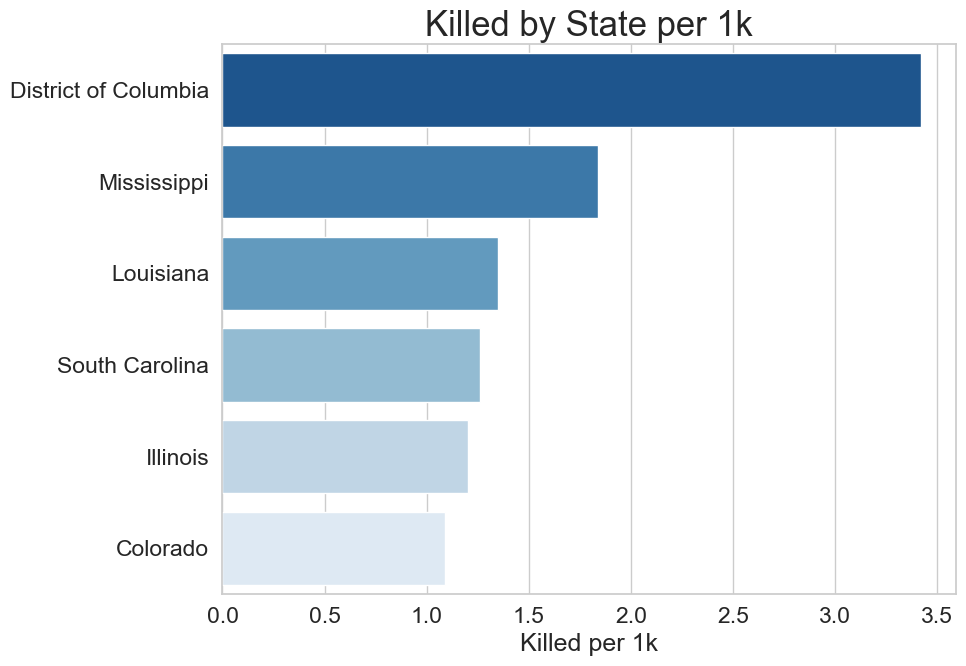

In [26]:
# top N killed per 1k
bar_horiz(df_per_1k.sort_values(by="killed_per_1k",ascending=False).head(6),
         colx="killed_per_1k",
         coly="state",
         xlabel="Killed per 1k",
         title="Killed by State per 1k",
         titlesize=25,
         figsize=(10,7))

Saving figure injured_by_state_per_1k


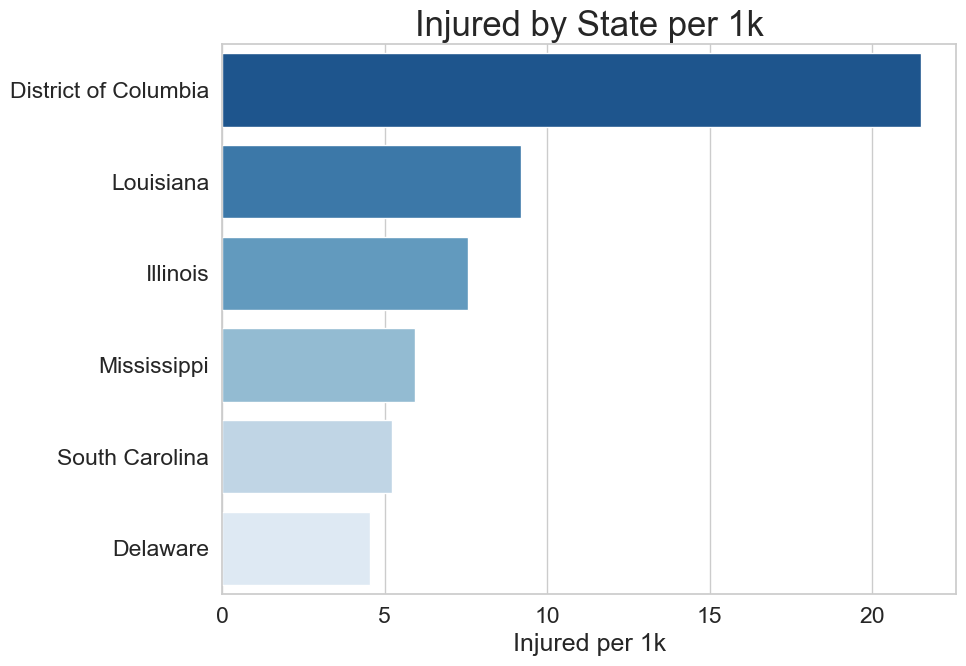

In [27]:
# top N injured per 1k
bar_horiz(df_per_1k.sort_values(by="injured_per_1k",ascending=False).head(6),
         colx="injured_per_1k",
         coly="state",
         xlabel="Injured per 1k",
         title="Injured by State per 1k",
         titlesize=25,
         figsize=(10,7))

Saving figure injured_and_killed_by_state_per_1k


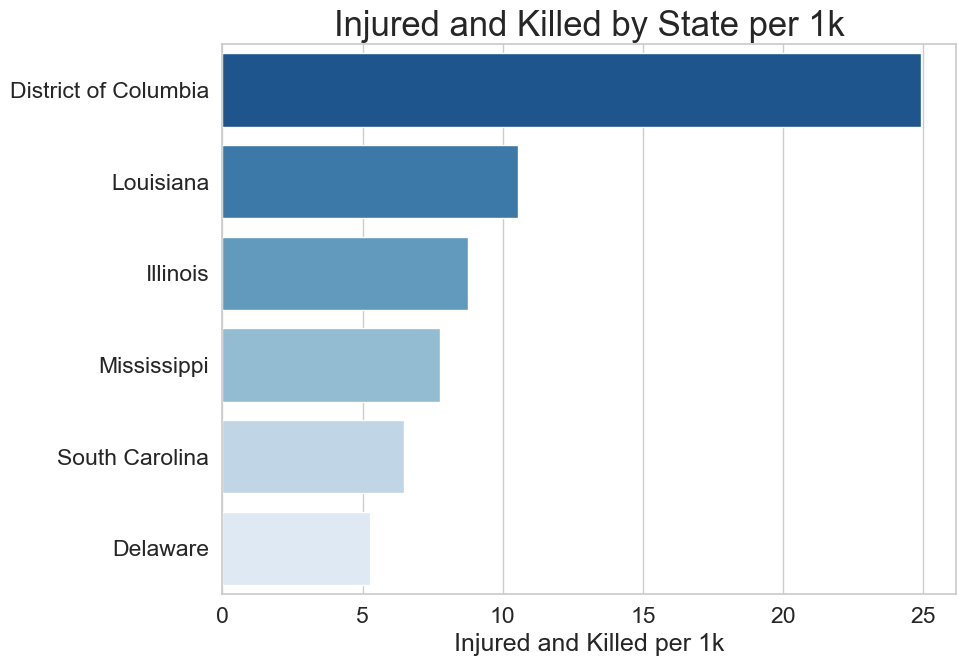

In [28]:
# top N total injured and killed per 1k
bar_horiz(df_per_1k.sort_values(by="total_per_1k",ascending=False).head(6),
         colx="total_per_1k",
         coly="state",
         xlabel="Injured and Killed per 1k",
         title="Injured and Killed by State per 1k",
         titlesize=25,
         figsize=(10,7))

Normalizing metrics for population causes DC to be an outlier.

In [29]:
df_per_1k[df_per_1k["state"] == "District of Columbia"]

,state,population,state_fips,pop_per_1k,count_per_1k,injured_per_1k,killed_per_1k,total_per_1k
22,District of Columbia,701974.0,11,702.0,4.56,21.51,3.42,24.93


### Mapping

Let's map a few maps that showcase different per 1k aspects geographically.

In [30]:
# import shapefile
us_shp = gpd.GeoDataFrame(pd.read_pickle("./data/pickle/us_census_shp"))

In [31]:
# import gun laws
df_gun_laws = pd.read_pickle("./data/pickle/df_gun_laws")

In [32]:
# join with us_census 
gdf_per_1k = gpd.GeoDataFrame(df_per_1k.merge(us_shp, how="outer"))
# join with gun laws
gdf_per_1k = gdf_per_1k.merge(df_gun_laws, how="outer")

<AxesSubplot:xlabel='lawtotal', ylabel='count_per_1k'>

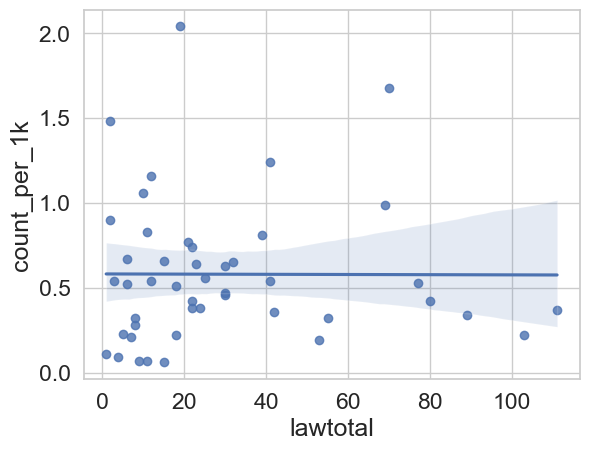

In [33]:
# look at gun laws verse per1k numbers
sns.regplot(x=gdf_per_1k["lawtotal"],y=gdf_per_1k["count_per_1k"])

Saving figure mass_shooting_incident_count_per_1k
with_washington_dc
(2019-2022)


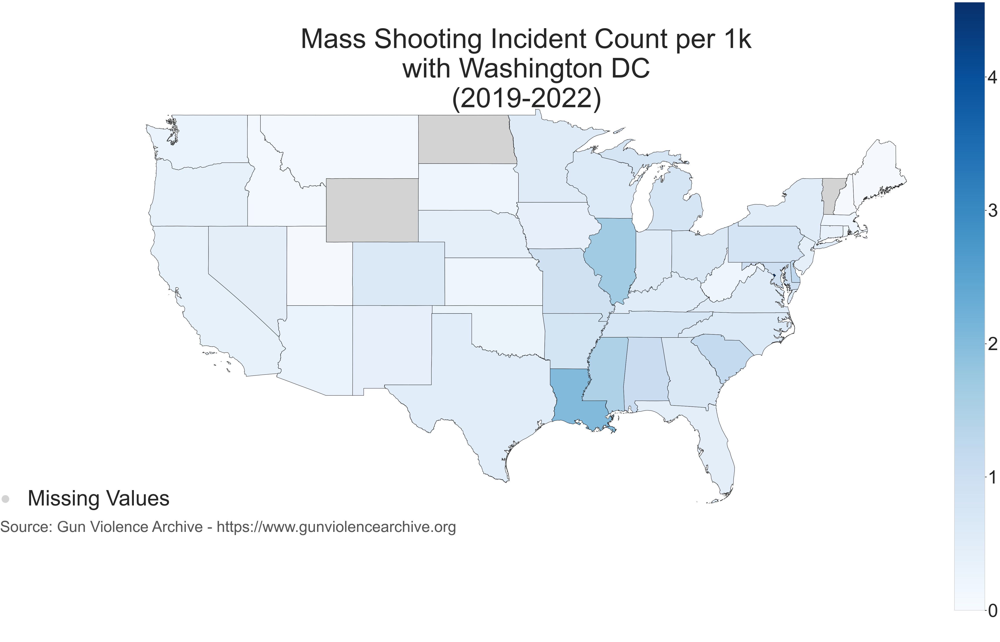

In [34]:
# incident per 1k
create_choropleth_map(df=gdf_per_1k, col="count_per_1k", 
                      title='Mass Shooting Incident Count per 1k\nwith Washington DC\n(2019-2022)',
                      color_map="Blues",vmax=max(gdf_per_1k["count_per_1k"]))

Because **District of Columbia** is such a small area, the stats per 1k skew the rest of the distribution. Mass shootings are prevalent there, however most of the constiuents that frequent that area do not live there. Need to get some data on that fact.
<br>
Let's visualize DC then view thematic map.

In [35]:
# filter dc
gdf_dc_filter = gdf_per_1k[gdf_per_1k["state"] != "District of Columbia"]

Saving figure mass_shooting_incident_count_per_1k
(2019-2022)


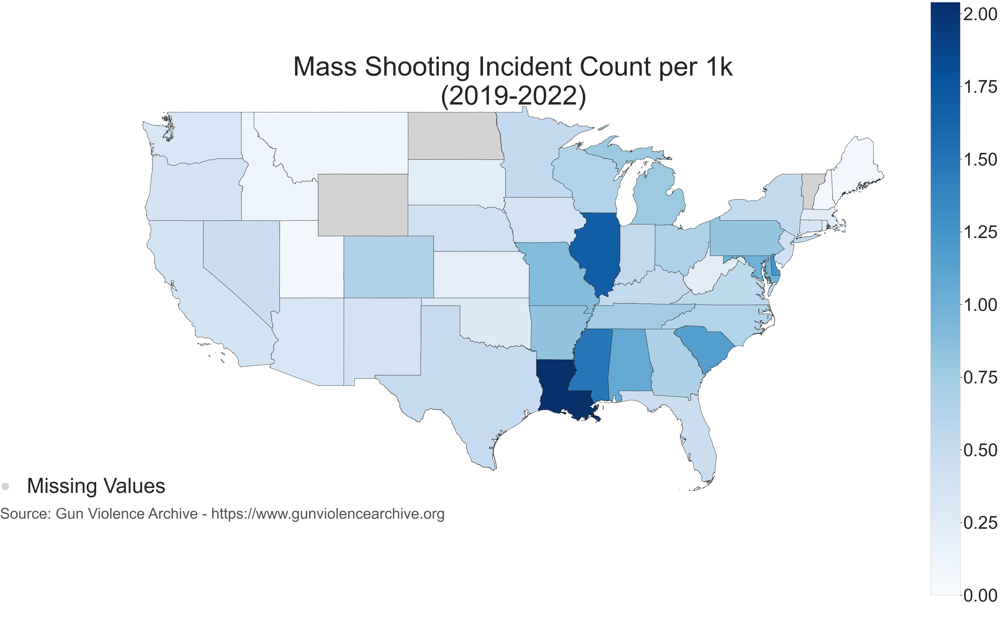

In [36]:
# filter out DC
create_choropleth_map(df=gdf_dc_filter, col="count_per_1k", 
                      title='Mass Shooting Incident Count per 1k\n(2019-2022)',
                      color_map="Blues",vmax=max(gdf_dc_filter["count_per_1k"]))

Without DC, the thematic map is much more clearly shows the states with higher incident counts of mass shootings:
- Louisana
- Illinois
- Missisippi
- South Carolina


Let's see if we can create an interactive map with popup that will be useful in an app

### Interactive Mapping

Let's utilize **folium** package to create an interactive map

In [37]:
# plot count per 1k
interactive_choro(gdf_dc_filter,shpfile=us_shp,col_key_val_list=["state","count_per_1k"],
                 tooltip_col_list=["stusps","count_per_1k","pop_per_1k"],
                 tooltip_name_list=["State","Mass Shooting per 1k","Population  per 1k"],
                 popup_col_list=["state","population","lawtotal"], popup_name_list=["State","Population",
                                                                                    "Total Gun Laws"])

Let's try it using the **ipyleaflet** package, however first need to wrangle the data a bit to plot with the Choropleth function

- turn gdf into a GeoJson
- map key value to a dictionary

In [38]:
# format population values with comma
gdf_dc_filter["population"]=gdf_dc_filter["population"].map('{:,.0f}'.format)
gdf_dc_filter["pop_per_1k"]=gdf_dc_filter["pop_per_1k"].map('{:,.0f}'.format)

In [39]:
# set index to fips code
# this will be the key in dict and has to match index
gdf_dc_filter=gdf_dc_filter.set_index(keys="state_fips")

In [40]:
# apply function to list and save as list for branca colormap
rgb_list = rgb_to_hex(linear.Blues_07.colors)

In [41]:
# create division of metric for legend
metric=divide_metric(gdf_dc_filter,"killed_per_1k")

In [42]:
# make gdf geojson
geojson_gdf=gdf_dc_filter.to_json()
geojson_gdf=json.loads(geojson_gdf)

In [43]:
# use function to plot
int_choro_ipyleaflet(geojson_gdf, colormap=linear.Blues_07,gdf=gdf_dc_filter, value="killed_per_1k",
                    title="Killed per 1k", metric=metric, rgb_list=rgb_list)

### Date exploration

What if we looked at date, creating a month and year column and then look at when the most mass shootings happened?

In [44]:
# create date cols
date_column(df_gun, "incident_date")

In [45]:
# preview result
df_gun.head()

,incident_id,incident_date,state,city_or_county,address,#_killed,#_injured,day,month,monthname,monthtype,year,dayofweek,dayname,daytype
0,2478664,2022-12-11,Illinois,Chicago,5500 block of W School St,3,1,11,12,Dec,Winter,2022,6,Sunday,Weekend
1,2478061,2022-12-09,Arizona,Phoenix,S 21st and W Burgess LN,1,3,9,12,Dec,Winter,2022,4,Friday,Weekday
2,2477622,2022-12-08,Michigan,Detroit,1114 Washington Blvd,0,4,8,12,Dec,Winter,2022,3,Thursday,Weekday
3,2477404,2022-12-08,Louisiana,New Orleans,4242 Chef Menteur Hwy,0,4,8,12,Dec,Winter,2022,3,Thursday,Weekday
4,2475554,2022-12-06,New York,Bronx,Daly Ave and E 180th St,0,4,6,12,Dec,Winter,2022,1,Tuesday,Weekday


Groupby day, count, killed and injured

In [46]:
# create variables for groupby func
groupby_list = ["dayname", "daytype"]
agg_dict = {"#_injured":"sum","#_killed":"sum","incident_id":"count"}
sort_order = ["incident_id","#_injured","#_killed"]

# apply function
df_day_grouped = groupby_mult(df_gun, groupby_list, agg_dict, sort_order)

# preview results
df_day_grouped

,dayname,daytype,#_injured,#_killed,incident_id
0,Sunday,Weekend,2468,540,566
1,Saturday,Weekend,2085,414,475
2,Friday,Weekday,907,212,230
3,Wednesday,Weekday,686,204,194
4,Monday,Weekday,799,177,190
5,Thursday,Weekday,698,184,178
6,Tuesday,Weekday,656,221,167


In [47]:
# rename incident_id col to count
df_day_grouped.rename(columns={"incident_id":"count"}, inplace=True)

Saving figure incident_count_by_day_of_the_week


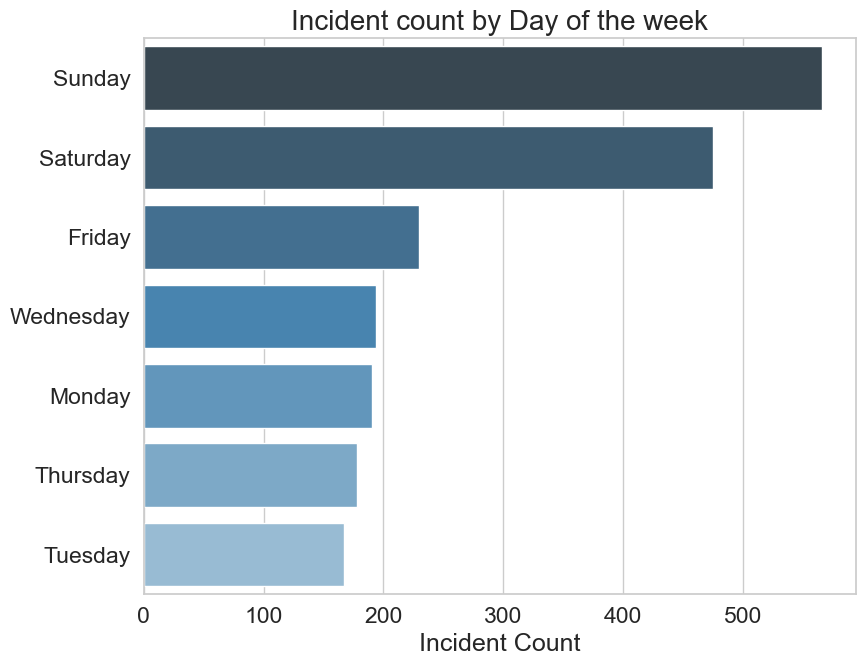

In [48]:
# plot total
bar_horiz(df_day_grouped, "count", "dayname", 
          "Incident Count", "Incident count by Day of the week", figsize=(9,7),
         palette="Blues_d")

Let's look ratio of `#_killed` and `#_injured` per day.

In [49]:
# create total injured/killed column per day
df_day_grouped["total_injured_killed"] = \
df_day_grouped["#_killed"] + df_day_grouped["#_injured"]

In [50]:
# set variables for function
col1_list = ["#_killed", "#_injured", "total_injured_killed"]
col2_list = ["count","count","count"]
new_col_list = ["killed_by_incident", "injured_by_incident", "total_by_incident"]


# killed by incident
ratio_func(df_day_grouped,col1_list, col2_list, new_col_list)

In [51]:
df_day_grouped

,dayname,daytype,#_injured,#_killed,count,total_injured_killed,killed_by_incident,injured_by_incident,total_by_incident
0,Sunday,Weekend,2468,540,566,3008,0.954064,4.360424,5.314488
1,Saturday,Weekend,2085,414,475,2499,0.871579,4.389474,5.261053
2,Friday,Weekday,907,212,230,1119,0.921739,3.943478,4.865217
3,Wednesday,Weekday,686,204,194,890,1.051546,3.536082,4.587629
4,Monday,Weekday,799,177,190,976,0.931579,4.205263,5.136842
5,Thursday,Weekday,698,184,178,882,1.033708,3.921348,4.955056
6,Tuesday,Weekday,656,221,167,877,1.323353,3.928144,5.251497


Saving figure total_killed_or_injured_per_incident_by_day


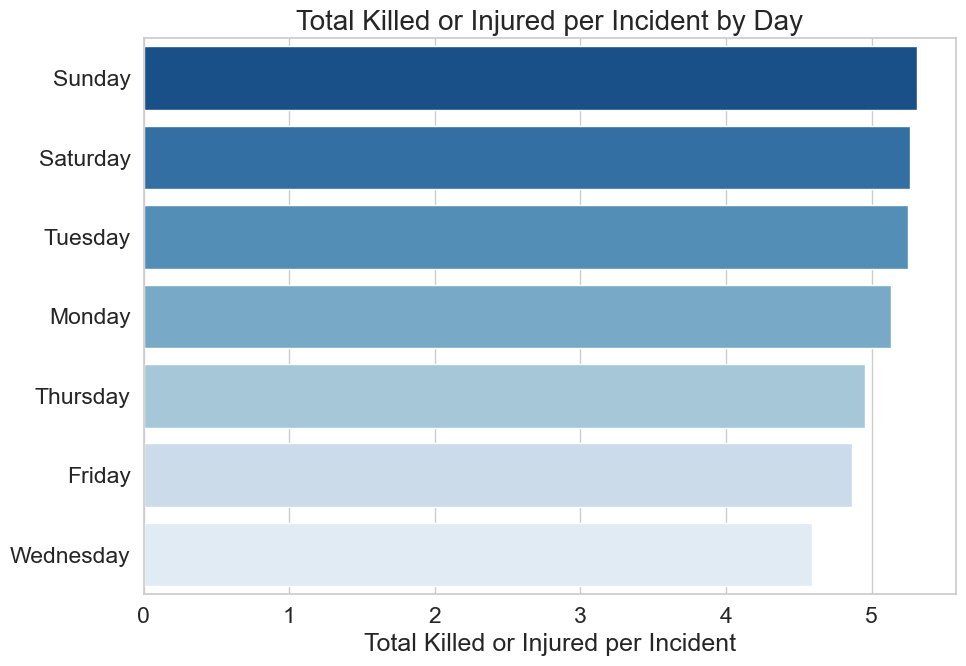

In [52]:
# weekday total per incident per day
bar_horiz(df_day_grouped.sort_values(by="total_by_incident",ascending=False),
          colx="total_by_incident",coly="dayname",
          xlabel="Total Killed or Injured per Incident",
          title="Total Killed or Injured per Incident by Day",
          figsize=(10,7))

So Sunday and Saturday have the most incidents per day, and they also have the highest ratio of `#_killed` and `#_injured` per incident. Interestingly, Tuesday is 3rd in ratio, whilst last in incident count, suggesting when mass shootings happen on Tuesday, they tend to have more injuries and casualties then any other weekday.
<br><br>
In fact, let's look at weekend day vs. weekday to see how drastic the comparision is.

Saving figure average_killed_or_injured_per_incident_by_day_type


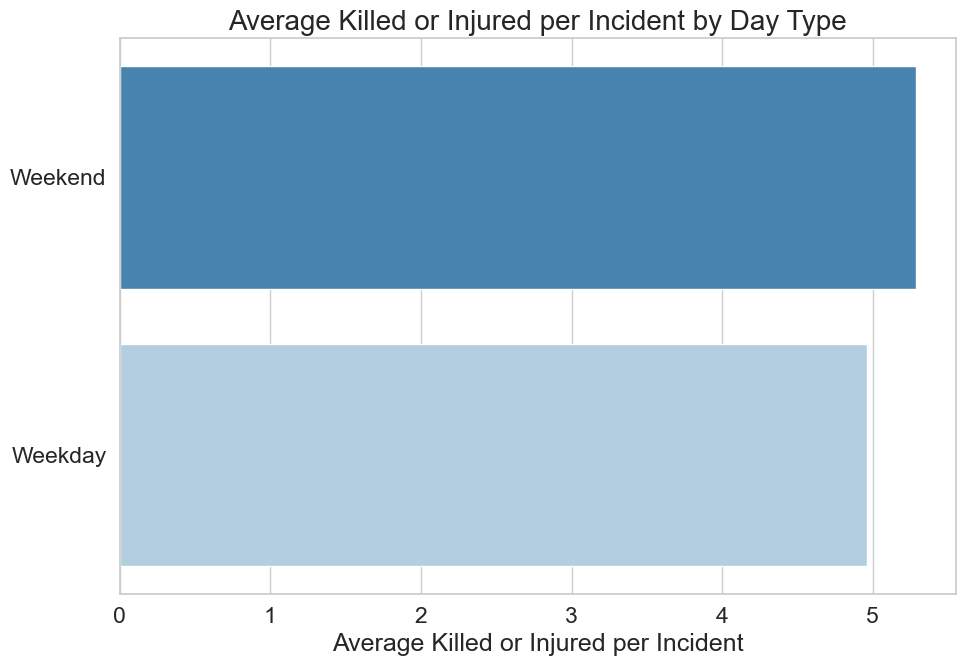

In [53]:
# weekend vs. weekday per incident per day
bar_horiz(pd.DataFrame(df_day_grouped.groupby("daytype", 
                                              as_index=False)["total_by_incident"]\
                       .mean()).sort_values(by="total_by_incident",ascending=False),
          colx="total_by_incident",coly="daytype",
          xlabel="Average Killed or Injured per Incident",
          title="Average Killed or Injured per Incident by Day Type",
          figsize=(10,7))

Can see the ratio of `#_killed` and `#_injured` for weekends is slightly higher the weekdays overall, telling us that not only are there more incidents on Weekends vs. Weekdays, but that they have more injuries and casualties. That said, it isn't that drastic of a difference, slightly over 5 for Weekends and slightly under 5 for Weekdays.

Let's groupby by month and take a look.

In [54]:
# create variables for groupby func
groupby_list = ["monthname", "monthtype"]
agg_dict = {"#_injured":"sum","#_killed":"sum","incident_id":"count"}
sort_order = ["incident_id","#_injured","#_killed"]

# apply function
df_month_grouped = groupby_mult(df_gun, groupby_list, agg_dict, sort_order)

# preview results
df_month_grouped

,monthname,monthtype,#_injured,#_killed,incident_id
0,Jul,Summer,1141,219,264
1,Jun,Summer,1011,214,234
2,Aug,Summer,833,164,205
3,Sep,Autmn,792,158,197
4,May,Spring,871,192,195
5,Oct,Autmn,788,218,193
6,Nov,Autmn,688,179,173
7,Apr,Spring,561,139,133
8,Mar,Spring,462,134,112
9,Dec,Winter,421,123,107


In [55]:
#time of year comp
df_season = df_month_grouped.groupby("monthtype").sum()

df_season.index

Index(['Autmn', 'Spring', 'Summer', 'Winter'], dtype='object', name='monthtype')

Saving figure total_killed_or_injured_per_season


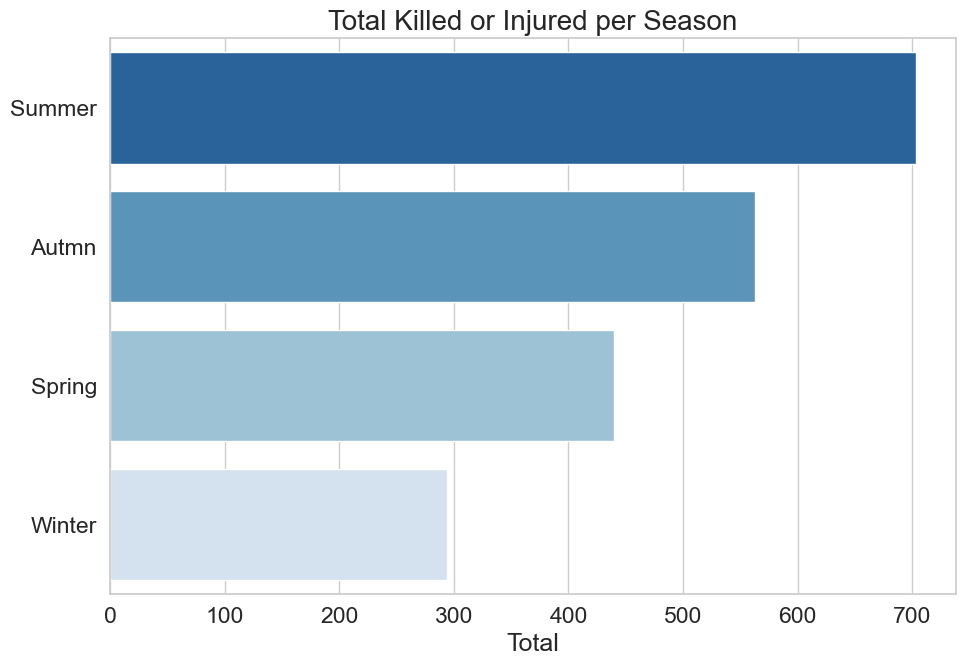

In [56]:
# weekend vs. weekday per incident per day
bar_horiz(pd.DataFrame(df_month_grouped.groupby("monthtype",as_index=False).sum()\
                       .sort_values(by="incident_id",ascending=False)),
          colx="incident_id",coly="monthtype",
          xlabel="Total",
          title="Total Killed or Injured per Season",
          figsize=(10,7))

Let's look at which month was the most harmful

In [57]:
df_month_grouped

,monthname,monthtype,#_injured,#_killed,incident_id
0,Jul,Summer,1141,219,264
1,Jun,Summer,1011,214,234
2,Aug,Summer,833,164,205
3,Sep,Autmn,792,158,197
4,May,Spring,871,192,195
5,Oct,Autmn,788,218,193
6,Nov,Autmn,688,179,173
7,Apr,Spring,561,139,133
8,Mar,Spring,462,134,112
9,Dec,Winter,421,123,107


In [58]:
# create total injured/killed column per month
df_month_grouped["total_injured_killed"] = \
df_month_grouped["#_killed"] + df_month_grouped["#_injured"]

In [59]:
# set variables for function
col1_list = ["#_killed", "#_injured", "total_injured_killed"]
col2_list = ["incident_id","incident_id","incident_id"]
new_col_list = ["killed_by_incident", "injured_by_incident", "total_by_incident"]


# killed by incident
ratio_func(df_month_grouped,col1_list, col2_list, new_col_list)

Saving figure average_killed_or_injured_per_incident_by_month_type


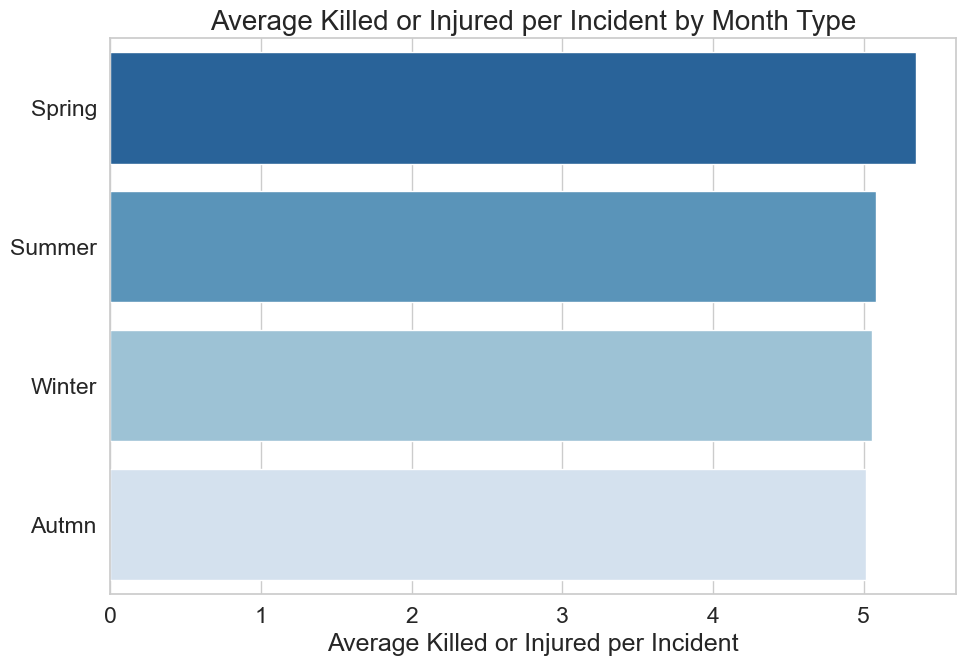

In [60]:
# weekend vs. weekday per incident per day
bar_horiz(pd.DataFrame(df_month_grouped.groupby("monthtype", 
                                              as_index=False)["total_by_incident"]\
                       .mean()).sort_values(by="total_by_incident",ascending=False),
          colx="total_by_incident",coly="monthtype",
          xlabel="Average Killed or Injured per Incident",
          title="Average Killed or Injured per Incident by Month Type",
          figsize=(10,7))

In [61]:
# pickle df_gun for app
df_gun.to_pickle("./data/pickle/df_gun")